# Installing Icevision

Icevision installation can be a bit difficult sometimes, you have to install it in a very specific way.

Steps:
1. Run the two cells below, first to uninstall base dependencies, second to install all new dependencies. (This should take around 10 - 15 mins)
2. Restart the kernel of your notebook server for the new packages to be recognised. (In Kaggle go to the top right three dots and select "Restart and clear cell outputs"

After this everything is now installed and you ran run the rest of the notebook like normal

In [ ]:
# Uninstall previous dependencies to prevent conflicts
!pip uninstall tensorflow -yq
!pip uninstall tfx-bsl -yq
!pip uninstall tensorflow-transform -yq
!pip uninstall tensorflow-cloud -yq
!pip uninstall explainable-ai-sdk -yq
!pip uninstall dask-cudf -yq
!pip uninstall beatrix-jupyterlab -yq
!pip uninstall thinc -yq
!pip uninstall g-extensions -yq
!pip uninstall xtensions -yq
!pip uninstall pdpbox -yq
!pip uninstall flax -yq
!pip uninstall flake8 -yq
!pip uninstall ta -yq
!pip uninstall dask-cudf -yq
!pip uninstall apache-beam -yq
!pip uninstall allennlp -yq
!pip uninstall aiobotocore -yq
!pip uninstall space -yq
!pip uninstall fastai -yq
!pip uninstall fastcore -yq
!pip uninstall spacy -yq
!pip uninstall pytorch-lightning -yq
!pip uninstall en-core-web-sm -yq
!pip uninstall en-core-web-lg -yq

In [ ]:
# Install new dependencies 
!pip install -U torch==1.10.0+cu111 torchvision==0.11.1+cu111 -f https://download.pytorch.org/whl/torch_stable.html
!pip install mmcv-full==1.3.17 -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!pip install mmdet==2.17.0
!pip install icevision==0.11.0
!pip install icedata==0.5.1
!pip install -U setuptools==59.5.0
!pip install -U distutils==3.8.13
!pip install openvino-dev
!pip install distinctipy
!pip install -U pillow
!pip install sahi

## Restart

Now you have run the two cells, restart your notebook's kernal.

## Imports

In [1]:
from icevision.all import *
from sahi.utils.coco import Coco, CocoCategory, CocoImage, CocoAnnotation
from sahi.utils.file import save_json
from PIL import Image

INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /root/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:70
INFO     - Downloading mmdet configs | icevision.models.mmdet.download_configs:download_mmdet_configs:31


0B [00:00, ?B/s]

## Preparing Data

In [2]:
!git clone https://github.com/MiguelARD/DoorDetect-Dataset.git

Cloning into 'DoorDetect-Dataset'...
remote: Enumerating objects: 2355, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 2355 (delta 0), reused 1 (delta 0), pack-reused 2352
Receiving objects: 100% (2355/2355), 327.91 MiB | 36.96 MiB/s, done.
Resolving deltas: 100% (15/15), done.
Updating files: 100% (2433/2433), done.


In [3]:
# Create path objects for all relevent dataset folders for use in the rest of notebook
base_path = Path("./DoorDetect-Dataset")
image_path = Path("./DoorDetect-Dataset/images")
label_path = Path("./DoorDetect-Dataset/labels")

In [8]:
# Test that images are in correct location
image_path.ls()

### Creating Coco format for data

The following section uses the sahi library to create a coco.json file for use in icevision for this dataset

In [12]:
coco = Coco()

# Add Categories for dataset
coco.add_category(CocoCategory(id=0, name='door'))
coco.add_category(CocoCategory(id=1, name='handle'))

In [ ]:
# If image exists in image folder, but does not in label folder, delete image
for image in list(image_path.glob("*.jpg")):
    image_file_name = image.name
    file_code = image_file_name.split('.')[0]
    label_file_name = file_code + ".txt"
    if (not((label_path/label_file_name).exists())):
        (image_path/image_file_name).unlink()

In [13]:
# Loop through every image file
for image in list(image_path.glob("*.jpg")):
    image_file_name = image.name
    file_code = image_file_name.split('.')[0]
    label_file_name = file_code + ".txt"
    
    width, height = Image.open(image).size
    
    # Create coco image object
    coco_image = CocoImage(file_name=image_file_name, width=width, height=height)

    # Open label file for corresponding image file
    with (label_path/label_file_name).open() as f:
        # Remove \n character for each line in txt file
        file_lines = list(map(lambda o: o.replace('\n', ''), f.readlines()))
        
        for line in file_lines:
            # First number in line represents class
            category = int(line.split(" ")[0])
            # All other numbers represent coordinates
            coords = list(map(lambda o: float(o), line.split(" ")[1:]))
            
            # Only interested in category 0 (door) and category 1 (handle) discard all other categories
            if category == 0 or category == 1: 
                # split coords list into individual values
                x_min, y_min, cat_width, cat_height = coords

                # Converts float normalised values into pixel values
                cat_width = int(cat_width * width)
                cat_height = int(cat_height * height)
                
                # Calculates bottom left coord from center coord (provided in dataset) minus half of width and height
                x_min = int(x_min * width) - (cat_width / 2)
                y_min = int(y_min * height) - (cat_height / 2)
                
                coco_annotation = CocoAnnotation(
                    bbox=[x_min, y_min, cat_width, cat_height],
                    category_id=category,
                    category_name= "door" if category == 0 else "handle"
                )
                # Only add annotation data if the bounding box has an area greater than 0
                if coco_annotation.area > 0:
                    coco_image.add_annotation(coco_annotation)
        
        coco.add_image(coco_image)

In [14]:
len(list(coco.json['images']))

1169

In [15]:
# Sample annotation data
coco.json['annotations'][:5]

[{'iscrowd': 0,
  'image_id': 1,
  'bbox': [695, 220, 22, 212],
  'segmentation': [],
  'category_id': 1,
  'id': 1,
  'area': 4664},
 {'iscrowd': 0,
  'image_id': 1,
  'bbox': [280, 214, 24, 192],
  'segmentation': [],
  'category_id': 1,
  'id': 2,
  'area': 4608},
 {'iscrowd': 0,
  'image_id': 2,
  'bbox': [638, 467, 19, 20],
  'segmentation': [],
  'category_id': 1,
  'id': 3,
  'area': 380},
 {'iscrowd': 0,
  'image_id': 2,
  'bbox': [696, 464, 17, 18],
  'segmentation': [],
  'category_id': 1,
  'id': 4,
  'area': 306},
 {'iscrowd': 0,
  'image_id': 2,
  'bbox': [690, 428, 17, 15],
  'segmentation': [],
  'category_id': 1,
  'id': 5,
  'area': 255}]

In [18]:
save_json(data=coco.json, save_path=base_path/"coco.json")

In [22]:
# Checks if coco.json file was created successfully
(base_path/"coco.json").exists()

True

In [24]:
# Icevision coco data parser, uses newly created coco.json file
parser = parsers.COCOBBoxParser(annotations_filepath=base_path/"coco.json", img_dir=image_path)

In [26]:
# Parses coco format into format Icevision can use
train_records, valid_records = parser.parse()

  0%|          | 0/4469 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/884 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 120) - Clipping bbox xmin from -1 to 0 (Before: <BBox (xmin:-1, ymin:568, xmax:139, ymax:653)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 431) - Clipping bbox xmin from -1 to 0 (Before: <BBox (xmin:-1, ymin:249, xmax:43, ymax:589)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 436) - Clipping bbox xmin from -1 to 0 (Before: <BBox (xmin:-1, ymin:58, xmax:79, ymax:667)>) | icevision.utils.logger_utils:autofix_log:17


In [27]:
# Classes contained in parser
parser.class_map

<ClassMap: {'background': 0, 'handle': 1}>

In [28]:
# Transforms
# size is set to 384 because EfficientDet requires its inputs to be divisible by 128
image_size = 384
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

In [29]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

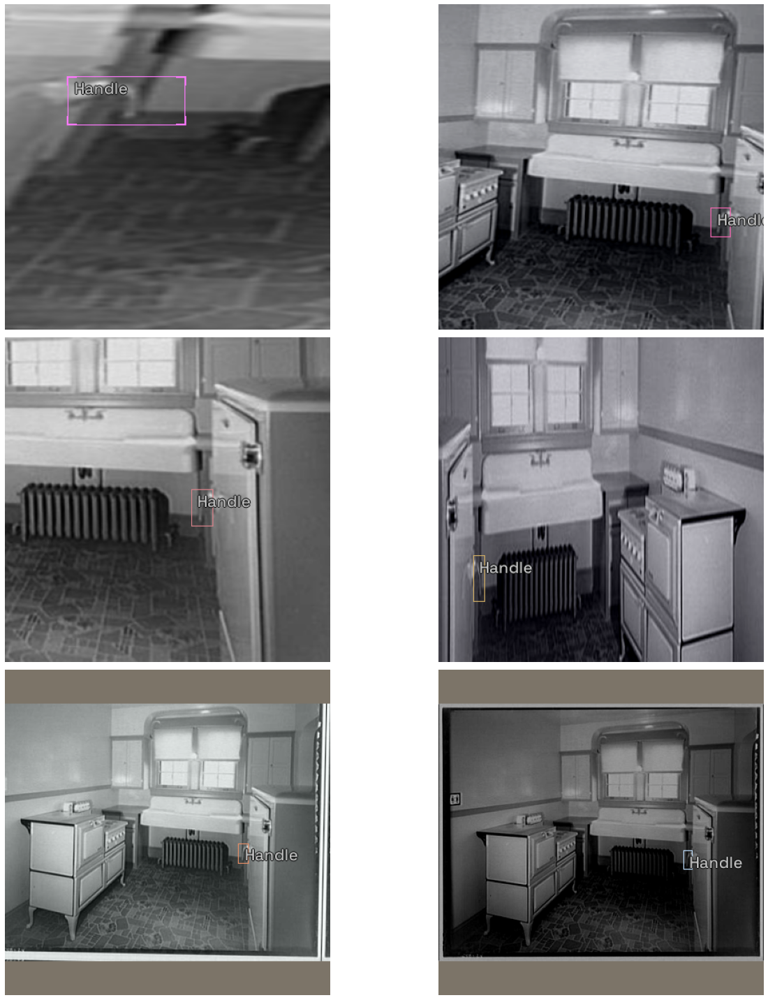

In [60]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(6)]
show_samples(samples, ncols=2, figsize=(20, 20))

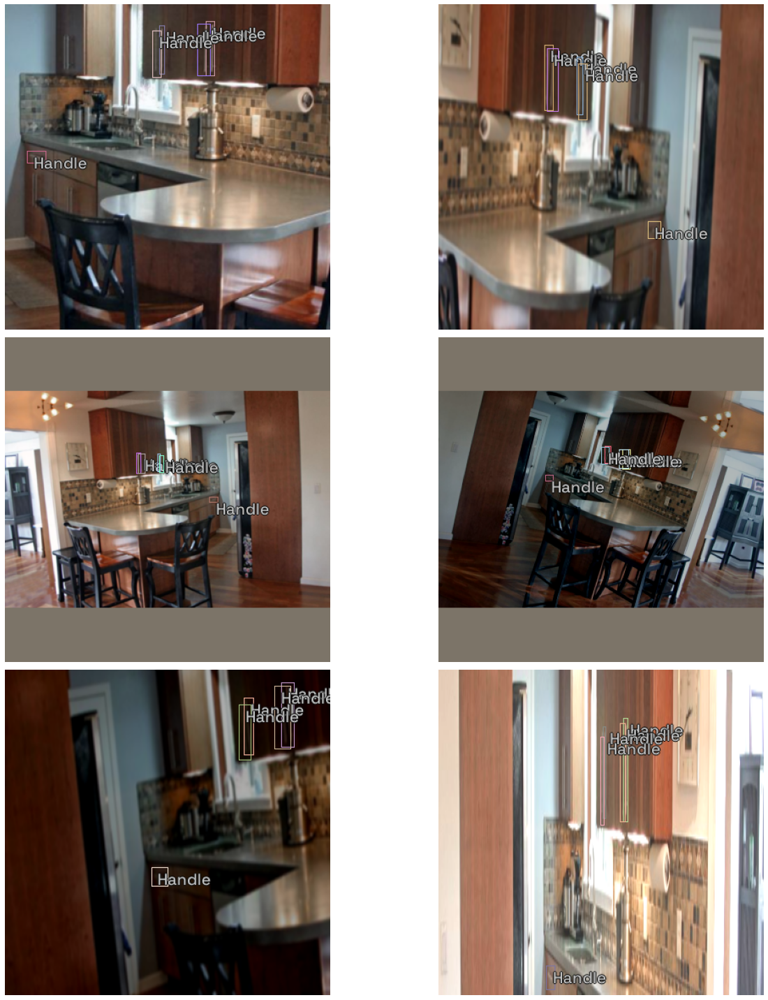

In [61]:
# Show another example with transformation applied
samples = [train_ds[1] for _ in range(6)]
show_samples(samples, ncols=2, figsize=(20,20))

## Creating Model

In [33]:
# Define model type and backbone
model_type = models.mmdet.retinanet
backbone = model_type.backbones.resnet50_fpn_1x(pretrained=True)

In [34]:
backbone.__dict__

{'model_name': 'retinanet',
 'config_path': Path('/root/.icevision/mmdetection_configs/mmdetection_configs-2.16.0/configs/retinanet/retinanet_r50_fpn_1x_coco.py'),
 'weights_url': 'http://download.openmmlab.com/mmdetection/v2.0/retinanet/retinanet_r50_fpn_1x_coco/retinanet_r50_fpn_1x_coco_20200130-c2398f9e.pth',
 'pretrained': True}

In [36]:
# Instantiate the model
model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser.class_map))

  0%|          | 0/152149505 [00:00<?, ?B/s]

/opt/conda/lib/python3.7/site-packages/mmdet/core/anchor/builder.py:17: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '
2022-08-03 09:09:56,036 - mmcv - INFO - initialize ResNet with init_cfg {'type': 'Pretrained', 'checkpoint': 'torchvision://resnet50'}
2022-08-03 09:09:56,039 - mmcv - INFO - load model from: torchvision://resnet50
2022-08-03 09:09:56,042 - mmcv - INFO - load checkpoint from torchvision path: torchvision://resnet50
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

2022-08-03 09:09:57,247 - mmcv - WARNING - The model and loaded state dict do not match exactly

unexpected key in source state_dict: fc.weight, fc.bias

2022-08-03 09:09:57,280 - mmcv - INFO - initialize FPN with init_cfg {'type': 'Xavier', 'layer': 'Conv2d', 'distribution': 'uniform'}
2022-08-03 09:09:57,378 - mmcv - INFO - initialize RetinaHead with init_cfg {'type': 'Normal', 'layer': 'Conv2d', 'std': 0.01, 'override': {'type': 'Normal', 'name': 'retina_cls', 'std': 0.01, 'bias_prob': 0.01}}
2022-08-03 09:09:57,439 - mmcv - INFO - 
backbone.conv1.weight - torch.Size([64, 3, 7, 7]): 
PretrainedInit: load from torchvision://resnet50 
 
2022-08-03 09:09:57,443 - mmcv - INFO - 
backbone.bn1.weight - torch.Size([64]): 
PretrainedInit: load from torchvision://resnet50 
 
2022-08-03 09:09:57,446 - mmcv - INFO - 
backbone.bn1.bias - torch.Size([64]): 
PretrainedInit: load from torchvision://resnet50 
 
2022-08-03 09:09:57,449 - mmcv - INFO - 
backbone.layer1.0.conv1.weight - torch.Size([64

load checkpoint from local path: checkpoints/retinanet/retinanet_r50_fpn_1x_coco_20200130-c2398f9e.pth
The model and loaded state dict do not match exactly

size mismatch for bbox_head.retina_cls.weight: copying a param with shape torch.Size([720, 256, 3, 3]) from checkpoint, the shape in current model is torch.Size([9, 256, 3, 3]).
size mismatch for bbox_head.retina_cls.bias: copying a param with shape torch.Size([720]) from checkpoint, the shape in current model is torch.Size([9]).


In [37]:
# Data Loaders
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=2, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=2, shuffle=False)

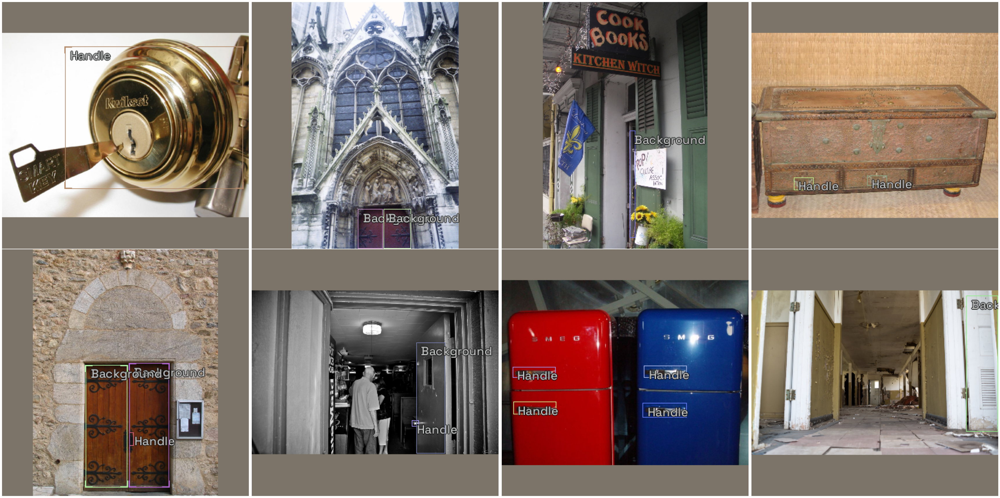

In [38]:
# Show batch
model_type.show_batch(first(valid_dl), ncols=4)

In [39]:
# Define metrics
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

In [40]:
# Define Learner
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

/opt/conda/lib/python3.7/site-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/opt/conda/lib/python3.7/site-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=5.248074739938602e-05)

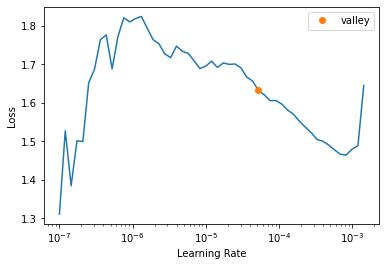

In [41]:
learn.lr_find()

## Training

In [43]:
learn.fine_tune(20, 0.00158, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.531373,1.850716,0.000003,00:45


/opt/conda/lib/python3.7/site-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/opt/conda/lib/python3.7/site-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


epoch,train_loss,valid_loss,COCOMetric,time
0,1.105931,1.099640,0.009964,00:51
1,0.999155,1.144872,0.007344,00:48
2,0.958851,1.028587,0.008358,00:49
3,1.028987,1.024895,0.018663,00:49
4,1.030212,1.097236,0.009190,00:50
5,0.990452,1.089118,0.021726,00:49
6,0.941614,0.961433,0.014814,00:50
7,0.904505,1.026592,0.023530,00:48
8,0.856562,0.978427,0.020692,00:49
9,0.808821,1.072976,0.011701,00:49


## Predictions

In [64]:
infer_dl = model_type.infer_dl(valid_ds, batch_size=4, shuffle=False)
preds = model_type.predict_from_dl(model, infer_dl, keep_images=True, detection_threshold=.25)

  0%|          | 0/45 [00:00<?, ?it/s]

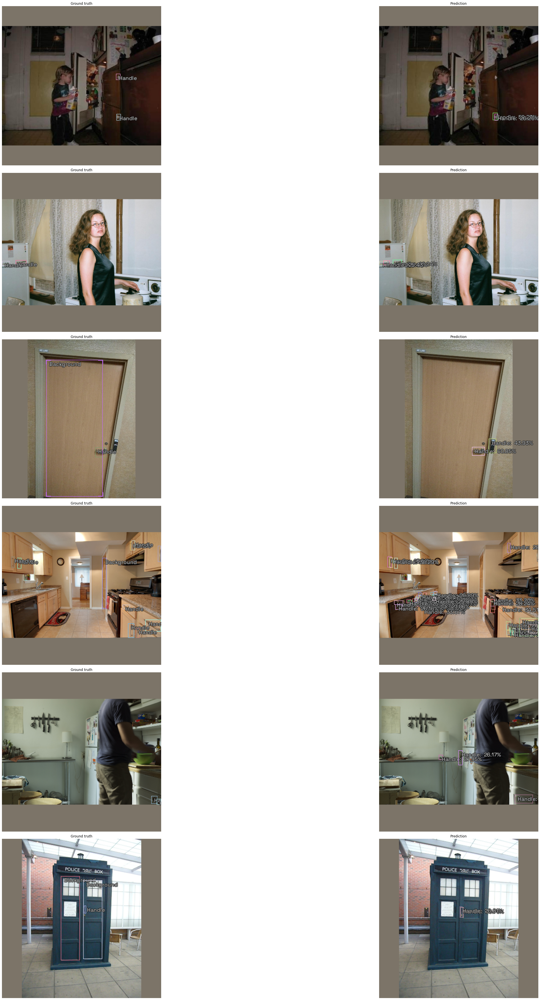

In [71]:
show_preds(preds=preds[8:14], figsize=(50, 50))